In [2]:
import pandas as pd 
from ydata_profiling import ProfileReport
# import sweetviz as sv
# import matplotlib.pyplot as plt

Pandas backend NOT loaded
Numpy backend NOT loaded
Pyspark backend NOT loaded
Python backend loaded


In [3]:
df_listings_sum = pd.read_csv('listings_summary.csv')
df_neighboorhoods = pd.read_csv('neighbourhoods.csv')
df_rev_sum = pd.read_csv('reviews_summary.csv')

In [16]:
profile_listing = ProfileReport(df_listings_sum)
profile_listing

Render HTML: 100%|██████████| 1/1 [00:03<00:00,  3.37s/it]


In [5]:
df_listings_sum.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,5396,Your perfect Paris studio on Île Saint-Louis,7903,Borzou,NaN,Hôtel-de-Ville,48.85247,2.35835,Entire home/apt,88.0,3,425,2024-11-23,2.26,1,77,51,7510402838018
1,7964,Sunny apartment with balcony,22155,Anaïs,NaN,Opéra,48.87417,2.34245,Entire home/apt,NaN,7,5,2015-09-14,0.03,1,0,0,7510903576564
2,9952,Paris petit coin douillet,33534,Elisabeth,NaN,Popincourt,48.86238,2.36957,Entire home/apt,150.0,4,52,2024-09-24,0.36,1,250,3,7511101582862
3,11487,"Heart of Paris, brand new aparment.",42666,Brigitte,NaN,Popincourt,48.86351,2.37110,Entire home/apt,80.0,30,13,2024-09-27,0.09,2,246,5,"Available with a mobility lease only (""bail mo..."
4,12452,Voltaire Charm,48733,Irene,NaN,Popincourt,48.85974,2.37932,Entire home/apt,201.0,1,62,2024-10-11,0.77,1,34,4,7511102600669


In [6]:
filtered_cols = ['id', 'neighbourhood', 'room_type', 'price', 'minimum_nights', 'number_of_reviews',
                 'reviews_per_month', 'calculated_host_listings_count', 'availability_365', 'number_of_reviews_ltm']

df_listings_filt = df_listings_sum[filtered_cols].copy()

In [18]:
df_listings_filt[['neighbourhood', 'price', 'id']].groupby('neighbourhood').aggregate({
                                                                                'price': [lambda x: x.quantile(0.25), 'median', 'mean',lambda x: x.quantile(0.75) ],
                                                                                'id': ['nunique']
                                                                            }).reset_index().head(20)

neighbourhood      price                                    id
                        <lambda_0> median        mean <lambda_1> nunique
0   Batignolles-Monceau      110.0  150.0  226.470952     187.00    6300
1                Bourse      130.0  175.5  248.720934     238.00    3148
2       Buttes-Chaumont       93.0  120.0  161.827363     124.00    5109
3     Buttes-Montmartre      100.0  125.0  158.730001     140.00    9963
4              Entrepôt      110.0  147.0  197.843595     161.00    6253
5              Gobelins       90.5  124.0  148.080801     135.00    2995
6        Hôtel-de-Ville      141.0  189.0  281.478915     243.00    2727
7                Louvre      164.0  203.0  295.587240     290.00    2069
8            Luxembourg      150.0  200.0  292.541291     279.25    2664
9          Ménilmontant       90.0  111.0  134.234239     120.00    4933
10         Observatoire       98.0  130.0  175.773913     150.00    3335
11                Opéra      140.0  169.0  229.110636     214.00    4447
12       Palais-Bourbon      150.0  200.0  309.467424     275.00    2686
13             Panthéon      135.0  168.0  219.442696     209.50    2923
14                Passy      125.0  195.0  324.856522     278.75    5750
15           Popincourt      109.0  136.0  177.402428     150.00    8071
16              Reuilly       99.0  125.0  190.735581     140.00    3589
17               Temple      138.0  183.5  232.091082     232.00    3936
18            Vaugirard      110.0  150.0  203.892966     180.00    7222
19               Élysée      153.0  220.0  364.316386     337.00    2911

In [7]:
df_listings_filt[['neighbourhood', 'room_type', 'price', 'id']].groupby(['neighbourhood','room_type']).aggregate({
                                                                                'price': [lambda x: x.quantile(0.25), 'median', 'mean',lambda x: x.quantile(0.75) ],
                                                                                'id': ['nunique']
                                                                            }).reset_index().head(20)

neighbourhood        room_type      price                       \
                                         <lambda_0>  median         mean   
0   Batignolles-Monceau  Entire home/apt     100.00   150.0   278.997293   
1   Batignolles-Monceau       Hotel room     180.00   212.0   271.311111   
2   Batignolles-Monceau     Private room      75.00   105.0   172.015152   
3   Batignolles-Monceau      Shared room      89.00    99.0   195.375000   
4                Bourse  Entire home/apt     123.00   175.5   276.525333   
5                Bourse       Hotel room     312.50   394.5   413.000000   
6                Bourse     Private room      84.50   124.0   202.343750   
7                Bourse      Shared room      56.75    72.5    67.750000   
8       Buttes-Chaumont  Entire home/apt      90.00   120.0   208.111153   
9       Buttes-Chaumont       Hotel room    1000.00  1000.0  1000.000000   
10      Buttes-Chaumont     Private room      55.75    70.0    92.615854   
11      Buttes-Chaumont      Shared room      30.50    34.0   149.064516   
12    Buttes-Montmartre  Entire home/apt      95.00   125.0   188.169784   
13    Buttes-Montmartre       Hotel room     137.00   202.0   290.979592   
14    Buttes-Montmartre     Private room      62.00    80.0   121.384988   
15    Buttes-Montmartre      Shared room      39.50    43.0   107.428571   
16             Entrepôt  Entire home/apt     100.00   147.0   240.311699   
17             Entrepôt       Hotel room     126.25   159.0   162.285714   
18             Entrepôt     Private room      70.00    96.0   162.355438   
19             Entrepôt      Shared room      34.50    47.0    89.777778   

                   id  
   <lambda_1> nunique  
0      250.00    5629  
1      317.00      52  
2      193.00     603  
3      220.00      16  
4      276.00    2919  
5      495.00      10  
6      249.75     213  
7       83.50       6  
8      185.00    4460  
9     1000.00       3  
10     100.00     605  
11      50.00      41  
12     194.00    9082  
13     386.00      53  
14     120.00     801  
15      71.50      27  
16     220.00    5544  
17     204.00      29  
18     160.00     644  
19      68.50      36

In [8]:
df_listings_filt['price'] = df_listings_filt.groupby(['neighbourhood','room_type'])['price'].transform(lambda x: x.fillna(x.median()))

In [9]:
df_listings_filt = df_listings_filt.drop(columns=['reviews_per_month'])


In [10]:
# df_listings_filt_enc = pd.get_dummies(df_listings_filt, columns=['neighbourhood', 'room_type'], drop_first=True)

from sklearn.preprocessing import OneHotEncoder

encoder_neig = OneHotEncoder(sparse=False, drop='first')
encoded_neig = encoder_neig.fit_transform(df_listings_filt[['neighbourhood']])
df_neig_encoded = pd.DataFrame(encoded_neig, columns=encoder_neig.get_feature_names_out(['neighbourhood']))

encoder_room = OneHotEncoder(sparse=False, drop='first')
encoded_room = encoder_room.fit_transform(df_listings_filt[['room_type']])
df_room_encoded = pd.DataFrame(encoded_room, columns=encoder_room.get_feature_names_out(['room_type']))

In [19]:
df_neig_encoded

,neighbourhood_Bourse,neighbourhood_Buttes-Chaumont,neighbourhood_Buttes-Montmartre,neighbourhood_Entrepôt,neighbourhood_Gobelins,neighbourhood_Hôtel-de-Ville,neighbourhood_Louvre,neighbourhood_Luxembourg,neighbourhood_Ménilmontant,neighbourhood_Observatoire,neighbourhood_Opéra,neighbourhood_Palais-Bourbon,neighbourhood_Panthéon,neighbourhood_Passy,neighbourhood_Popincourt,neighbourhood_Reuilly,neighbourhood_Temple,neighbourhood_Vaugirard,neighbourhood_Élysée
0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91026,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
91027,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
91028,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
91029,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [11]:
# Reverse transform to get original labels
decoded_neig = encoder_neig.inverse_transform(encoded_neig)

# Convert to DataFrame
df_decoded = pd.DataFrame(decoded_neig, columns=['neighbourhood'])


In [12]:
# df_listings_filt.join(encoded)
df_final = pd.concat([df_listings_filt.drop(columns=['neighbourhood']), df_neig_encoded], axis=1)
df_final = pd.concat([df_final.drop(columns=['room_type']), df_room_encoded], axis=1)
df_final = df_final.drop(columns=['id'])

In [13]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

inertia = []
# silhouette_scores = []

for k in range(1, 20):
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(df_final)
    inertia.append(kmeans.inertia_)
    # labels = kmeans.predict(df_final)
    # score = silhouette_score(df_final, labels)  # Compute silhouette score
    # silhouette_scores.append(score)


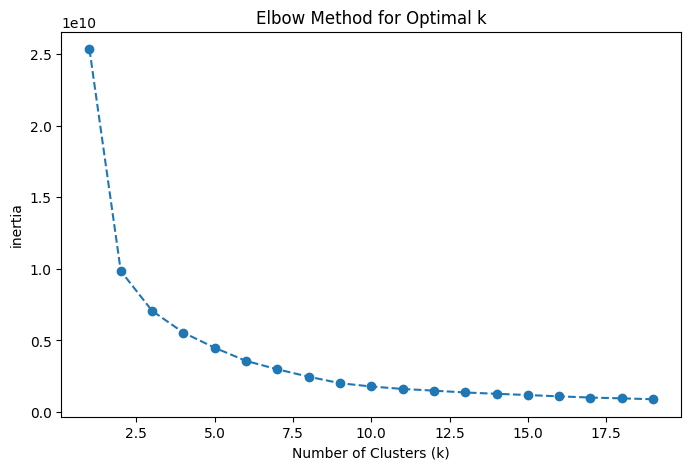

In [14]:
plt.figure(figsize=(8,5))
plt.plot(range(1, 20), inertia, marker='o', linestyle='--')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('inertia')
plt.title('Elbow Method for Optimal k')
plt.show()

In [15]:
# plt.figure(figsize=(8, 5))
# plt.plot(range(2, 20), silhouette_scores, marker='o', linestyle='--', color='g', label="Silhouette Score")
# plt.xlabel("Number of Clusters (K)")
# plt.ylabel("Silhouette Score")
# plt.title("Silhouette Score for Optimal K")
# plt.xticks(range(2, 20))
# plt.legend()
# plt.grid(True)
# plt.show()

In [21]:
kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
kmeans.fit(df_final)
df_listings_filt['cluster_group'] = kmeans.predict(df_final)

In [22]:
df_listings_filt

,id,neighbourhood,room_type,price,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365,number_of_reviews_ltm,cluster_group
0,5396,Hôtel-de-Ville,Entire home/apt,88.0,3,425,1,77,51,0
1,7964,Opéra,Entire home/apt,169.0,7,5,1,0,0,0
2,9952,Popincourt,Entire home/apt,150.0,4,52,1,250,3,3
3,11487,Popincourt,Entire home/apt,80.0,30,13,2,246,5,3
4,12452,Popincourt,Entire home/apt,201.0,1,62,1,34,4,0
...,...,...,...,...,...,...,...,...,...,...
91026,1304562779094087796,Buttes-Chaumont,Entire home/apt,100.0,30,0,1,85,0,0
91027,1304667478167694444,Ménilmontant,Entire home/apt,80.0,1,0,1,180,0,0
91028,1305050902233494632,Popincourt,Entire home/apt,818.0,1,0,107,264,0,3
91029,1305061192394005038,Vaugirard,Entire home/apt,840.0,1,0,107,316,0,3


In [23]:

df_listings_filt[['price','cluster_group']].groupby('cluster_group').aggregate([lambda x: x.quantile(0.25), 'median', lambda x: x.quantile(0.75)])

price                   
              <lambda_0>  median <lambda_1>
cluster_group                              
0                  111.0   133.0      168.0
1                 9238.0  9999.0     9999.0
2                 1348.0  1606.0     2227.0
3                  112.0   175.0      290.0

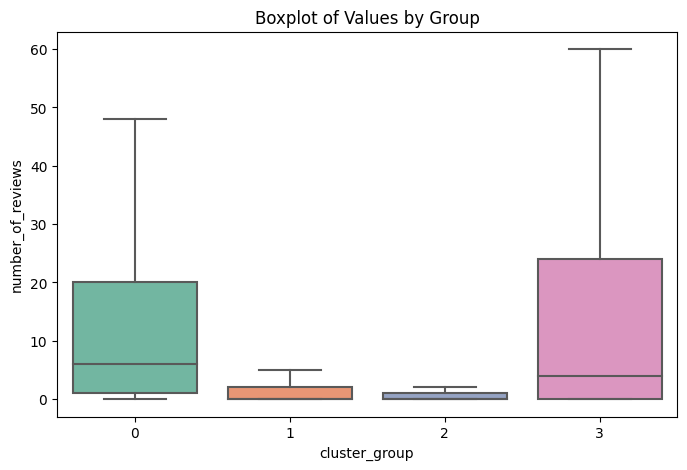

In [24]:
import seaborn as sns

# Create a boxplot
plt.figure(figsize=(8, 5))
sns.boxplot(x='cluster_group', y='number_of_reviews', data=df_listings_filt, palette="Set2", showfliers = False)
plt.xlabel("cluster_group")
plt.ylabel("number_of_reviews")
plt.title("Boxplot of Values by Group")
plt.show()

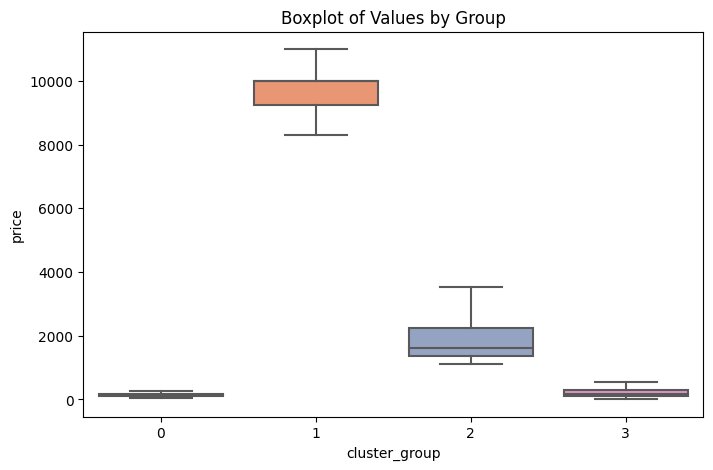

In [25]:
import seaborn as sns

# Create a boxplot
plt.figure(figsize=(8, 5))
sns.boxplot(x='cluster_group', y='price', data=df_listings_filt, palette="Set2", showfliers = False)
plt.xlabel("cluster_group")
plt.ylabel("price")
plt.title("Boxplot of Values by Group")
plt.show()

In [ ]:
import seaborn as sns

# Create a boxplot
plt.figure(figsize=(8, 5))
sns.boxplot(x='cluster_group', y='price', data=df_listings_filt, palette="Set2", showfliers = False)
plt.xlabel("cluster_group")
plt.ylabel("price")
plt.title("Boxplot of Values by Group")
plt.show()

In [24]:
df_listings_filt[['id','neighbourhood','room_type','cluster_group']].groupby(['cluster_group','neighbourhood','room_type']).nunique().reset_index()

,cluster_group,neighbourhood,room_type,id
0,0,Batignolles-Monceau,Entire home/apt,3184
1,0,Batignolles-Monceau,Hotel room,10
2,0,Batignolles-Monceau,Private room,353
3,0,Batignolles-Monceau,Shared room,10
4,0,Bourse,Entire home/apt,1295
...,...,...,...,...
208,3,Vaugirard,Private room,222
209,3,Vaugirard,Shared room,5
210,3,Élysée,Entire home/apt,1451
211,3,Élysée,Hotel room,63


## PCA

In [25]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_final)

pca = PCA()
pca.fit(X_scaled)

# explained_variance = np.cumsum(pca.explained_variance_ratio_)
pca.explained_variance_ratio_

array([0.06433266, 0.05072615, 0.04064543, 0.03973089, 0.03898228,
       0.03883167, 0.03852516, 0.03807438, 0.0378624 , 0.03754429,
       0.03739194, 0.03728605, 0.03716727, 0.03711963, 0.03701471,
       0.03696688, 0.03687473, 0.03679211, 0.03659063, 0.03623892,
       0.0356471 , 0.03517743, 0.03358983, 0.0320737 , 0.02782964,
       0.02591462, 0.01244822, 0.0026213 ])

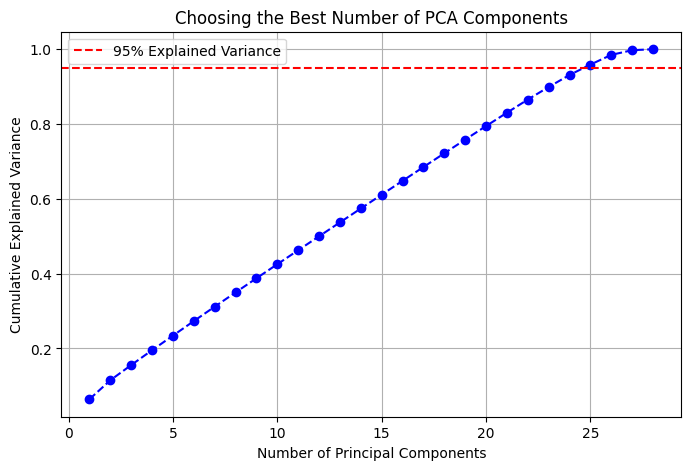

In [30]:
import numpy as np

explained_variance = np.cumsum(pca.explained_variance_ratio_)  # Cumulative sum

# Plot the Explained Variance
plt.figure(figsize=(8, 5))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='--', color='b')
plt.xlabel("Number of Principal Components")
plt.ylabel("Cumulative Explained Variance")
plt.title("Choosing the Best Number of PCA Components")
plt.axhline(y=0.95, color='r', linestyle='--', label="95% Explained Variance")
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
test